# Cluster Analysis of Bike Rental Demand

todo: introduction, heatmap

In [55]:
import numpy as np
import pandas as pd
from datetime import date, time, datetime, timedelta
import datetime
from matplotlib import pyplot
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import seaborn as sns
%matplotlib inline
import folium

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MiniBatchKMeans
from tslearn.clustering import TimeSeriesKMeans
from math import sin, cos, pi

In [6]:
df=pd.read_csv('../data/LA.csv')
df["start_time"] = pd.to_datetime(df['start_time'])
df["end_time"] = pd.to_datetime(df['end_time'] ) 
df["trip_duration"] = pd.to_timedelta(df.trip_duration)
df.head()

,start_time,end_time,start_station_id,end_station_id,bike_id,user_type,start_station_name,end_station_name,trip_duration,trip_duration_in_hours
0,2018-01-01 00:04:00,2018-01-01 00:25:00,3063,3018,5889,Walk-up,Pershing Square,Grand & Olympic,0 days 00:21:00,0.350000
1,2018-01-01 00:05:00,2018-01-01 00:25:00,3063,3018,6311,Walk-up,Pershing Square,Grand & Olympic,0 days 00:20:00,0.333333
2,2018-01-01 00:06:00,2018-01-01 00:25:00,3063,3018,5753,Walk-up,Pershing Square,Grand & Olympic,0 days 00:19:00,0.316667
3,2018-01-01 00:13:00,2018-01-01 00:35:00,3018,3031,6220,Monthly Pass,Grand & Olympic,7th & Spring,0 days 00:22:00,0.366667
4,2018-01-01 00:14:00,2018-01-01 00:59:00,4204,4216,12436,Monthly Pass,Washington & Abbot Kinney,17th St / SMC E Line Station,0 days 00:45:00,0.750000


## Cluster Analysis for Trip and Customer Types

### Data Prepatation
In the following, we conduct a K-Means cluster analysis of bike sharing demand for the city of LA, California in 2018. We choose the features hour and day of week of the start time as well as the duration of the trip for our analysis. We did not include the categorical variables user type and station names as they do not have a defined mean. We also did not include The station IDs because the distances between IDs are not necessarily meaningful.

In [7]:
df_sin_cos=df[["start_time","trip_duration_in_hours"]].copy()
df_sin_cos.loc[:,"hour"]= df_sin_cos.start_time.apply(lambda x: (x.hour)+(x.minute/60))
df_sin_cos.loc[:,"day_of_week"] = df_sin_cos.start_time.apply(lambda x: x.day_of_week)
df_sin_cos

,start_time,trip_duration_in_hours,hour,day_of_week
0,2018-01-01 00:04:00,0.350000,0.066667,0
1,2018-01-01 00:05:00,0.333333,0.083333,0
2,2018-01-01 00:06:00,0.316667,0.100000,0
3,2018-01-01 00:13:00,0.366667,0.216667,0
4,2018-01-01 00:14:00,0.750000,0.233333,0
...,...,...,...,...
306858,2018-12-31 23:31:00,0.383333,23.516667,0
306859,2018-12-31 23:40:00,0.266667,23.666667,0
306860,2018-12-31 23:42:00,0.233333,23.700000,0
306861,2018-12-31 23:46:00,0.150000,23.766667,0


To include the circular characteristic of time in our analysis, we represent the variable hour and day of the week as "circles" using sine and cosine functions.

In [8]:
def create_circular_feature(name, feature, df, num_of_values):
    df[name+"_sin"]= feature.apply(lambda x: sin(2*pi*(x/num_of_values)))
    df[name+"_cos"]= feature.apply(lambda x: cos(2*pi*(x/num_of_values)))

#create circular features for hour of start time 
create_circular_feature("hour", df_sin_cos.hour, df_sin_cos, 24)
create_circular_feature("day_of_week", df_sin_cos.day_of_week, df_sin_cos, 7)

#drop features not used in cluster analysis
X_df = df_sin_cos.drop(["hour","day_of_week","start_time"], axis=1)
X_df

,trip_duration_in_hours,hour_sin,hour_cos,day_of_week_sin,day_of_week_cos
0,0.350000,0.017452,0.999848,0.0,1.0
1,0.333333,0.021815,0.999762,0.0,1.0
2,0.316667,0.026177,0.999657,0.0,1.0
3,0.366667,0.056693,0.998392,0.0,1.0
4,0.750000,0.061049,0.998135,0.0,1.0
...,...,...,...,...,...
306858,0.383333,-0.126199,0.992005,0.0,1.0
306859,0.266667,-0.087156,0.996195,0.0,1.0
306860,0.233333,-0.078459,0.996917,0.0,1.0
306861,0.150000,-0.061049,0.998135,0.0,1.0


To include all features with the same weighting in the analysis, we standatize the columns before clustering.

In [9]:
# standardize the features of the dataset
scaler = StandardScaler()
scaler.fit(X_df)
X_scaled = scaler.transform(X_df)
X_scaled_df = pd.DataFrame(X_scaled, columns=X_df.columns, index=X_df.index)
X_scaled_df

,trip_duration_in_hours,hour_sin,hour_cos,day_of_week_sin,day_of_week_cos
0,-0.139620,0.571191,2.223871,0.003411,1.4169
1,-0.165073,0.578031,2.223728,0.003411,1.4169
2,-0.190526,0.584870,2.223554,0.003411,1.4169
3,-0.114167,0.632716,2.221446,0.003411,1.4169
4,0.471256,0.639545,2.221018,0.003411,1.4169
...,...,...,...,...,...
306858,-0.088714,0.345959,2.210808,0.003411,1.4169
306859,-0.266886,0.407175,2.217786,0.003411,1.4169
306860,-0.317792,0.420810,2.218990,0.003411,1.4169
306861,-0.445058,0.448108,2.221018,0.003411,1.4169


### Estimation of Hyperparameter 

In [10]:
k_max_sin_cos = 20
clusters_sin_cos = []
losses_sin_cos = []

for k in range(k_max_sin_cos ):
    model_sin_cos = MiniBatchKMeans(n_clusters=k+1,random_state=42,init="k-means++")
    model_sin_cos.fit(X_scaled)
    clusters_sin_cos.append(k+1)
    losses_sin_cos.append(model_sin_cos.inertia_)

C:\Users\Asus\anaconda3\envs\BananaCode\lib\site-packages\sklearn\cluster\_kmeans.py:1046: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\Asus\anaconda3\envs\BananaCode\lib\site-packages\sklearn\cluster\_kmeans.py:1046: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\Asus\anaconda3\envs\BananaCode\lib\site-packages\sklearn\cluster\_kmeans.py:1046: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variab

We use the elbow method to determine the best number of clusters for the bike-sharing demand data.

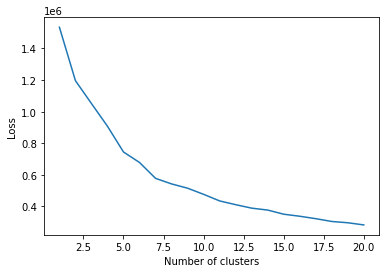

In [11]:
plt.plot(clusters_sin_cos, losses_sin_cos)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.show()

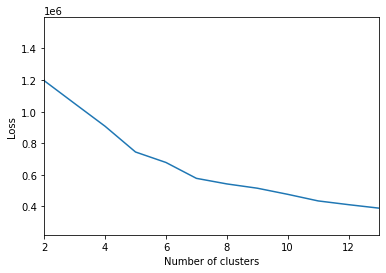

In [12]:
plt.plot(clusters_sin_cos, losses_sin_cos)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.xlim([2,13])
plt.show()

From the two plots above we expect seven clusters to be the best fit for our dataset.

### Clustering

In [13]:
# refit algorithm
means = MiniBatchKMeans(n_clusters=7, random_state=42,init="k-means++")
means.fit(X_scaled)

cluster_means = ["week-start,\n work and lunch", "weekend outing", "week-start,\n after-work", "weekend stroll",
                 "mid-week,\n after-work","voyager", "mid-week,\n work and lunch"]

#add cluster lables to the dataset
X_scaled_df["cluster"] = means.predict(X_scaled)
X_scaled_df["cluster"] = X_scaled_df["cluster"].apply(lambda x: cluster_means[x])

#add unedited features for better visual representation
X_scaled_df["trip_duration"]= df_sin_cos.trip_duration_in_hours
X_scaled_df["hour"]=df_sin_cos.hour
X_scaled_df["day_of_week"]=df_sin_cos.day_of_week
X_scaled_df["start_station_id"]=df.start_station_id

X_scaled_df

C:\Users\Asus\anaconda3\envs\BananaCode\lib\site-packages\sklearn\cluster\_kmeans.py:1046: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


,trip_duration_in_hours,hour_sin,hour_cos,day_of_week_sin,day_of_week_cos,cluster,trip_duration,hour,day_of_week,start_station_id
0,-0.139620,0.571191,2.223871,0.003411,1.4169,"week-start,\n after-work",0.350000,0.066667,0,3063
1,-0.165073,0.578031,2.223728,0.003411,1.4169,"week-start,\n after-work",0.333333,0.083333,0,3063
2,-0.190526,0.584870,2.223554,0.003411,1.4169,"week-start,\n after-work",0.316667,0.100000,0,3063
3,-0.114167,0.632716,2.221446,0.003411,1.4169,"week-start,\n after-work",0.366667,0.216667,0,3018
4,0.471256,0.639545,2.221018,0.003411,1.4169,"week-start,\n after-work",0.750000,0.233333,0,4204
...,...,...,...,...,...,...,...,...,...,...
306858,-0.088714,0.345959,2.210808,0.003411,1.4169,"week-start,\n after-work",0.383333,23.516667,0,3018
306859,-0.266886,0.407175,2.217786,0.003411,1.4169,"week-start,\n after-work",0.266667,23.666667,0,3064
306860,-0.317792,0.420810,2.218990,0.003411,1.4169,"week-start,\n after-work",0.233333,23.700000,0,3064
306861,-0.445058,0.448108,2.221018,0.003411,1.4169,"week-start,\n after-work",0.150000,23.766667,0,3069


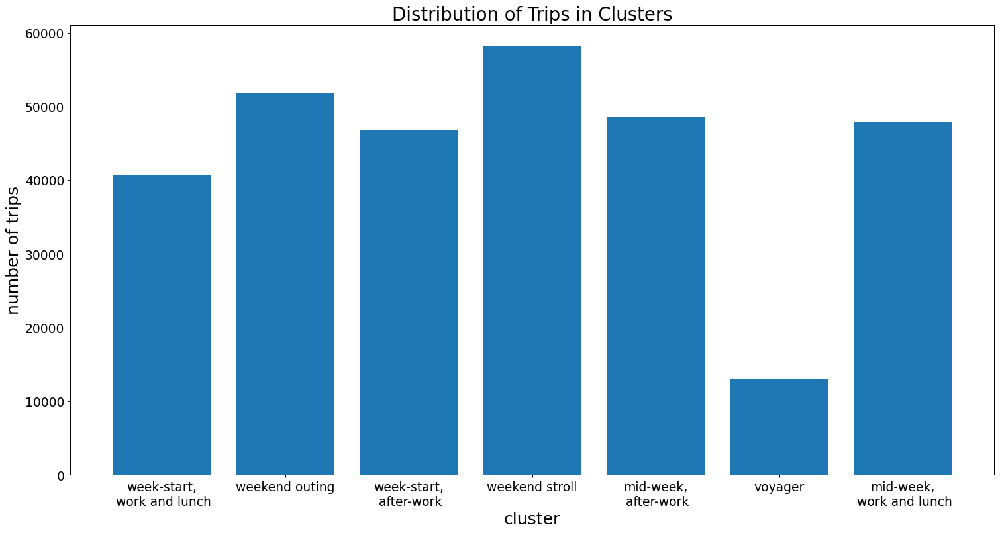

In [14]:
count = [len(X_scaled_df[X_scaled_df.cluster==cluster_means[i]]) for i in range(len(cluster_means))]

fig,ax = plt.subplots(figsize=(20,10), dpi=90) 
axis_font = {'size':'20'}
label_font = {'labelsize':'15'}
dic={'fontsize': '22'}

ax.set_title("Distribution of Trips in Clusters", dic)
ax.set_ylabel("number of trips", **axis_font)
ax.set_xlabel("cluster", **axis_font)
ax.tick_params(axis='both', **label_font)
    
plt.bar(cluster_means,count)
plt.show()

Using K-Means we identified the following seven trip and customer types:<br><br>

**voyager**: Customers who are on the road for more than 1.5 to 2 hours on any given day of the week, and especially midday <br>
**week-start, work and lunch**: Trips that take place on Mondays, Tuesdays or Wednesdays and mainly between 6 and 10 a.m. *(on the way to work)*  and 11 a.m. and 2 p.m. *(during lunch)*.<br>
 **mid-week, work and lunch**: Trips that occur on Thursdays or Fridays and primarily between 7 a.m. and 10 a.m. *(on the way to work)* and 11 a.m. and 3 p.m. *(during lunch)*.<br>
**week-start, after-work**: Trips that take place on Mondays or Tuesdays and mainly between 4 and 8 p.m. *(after work)* but also until 3 am in the night.<br>
**mid-week, after-work**: Trips that occuron Wednesdays or Thursdays and primarily between 4 and 8 am *(after work)* but also until 3 am in the night.<br>
**weekend stroll**: Trips that take place mainly on Saturdays and Sundays at noon and in the afternoon between 11 a.m. and 5 p.m.<br>
**weekend outing**: Trips that take place on Fridays, Saturdays or Sundays in the evening and at night.<br>

### Visual Representation of Temporal Demand Patterns

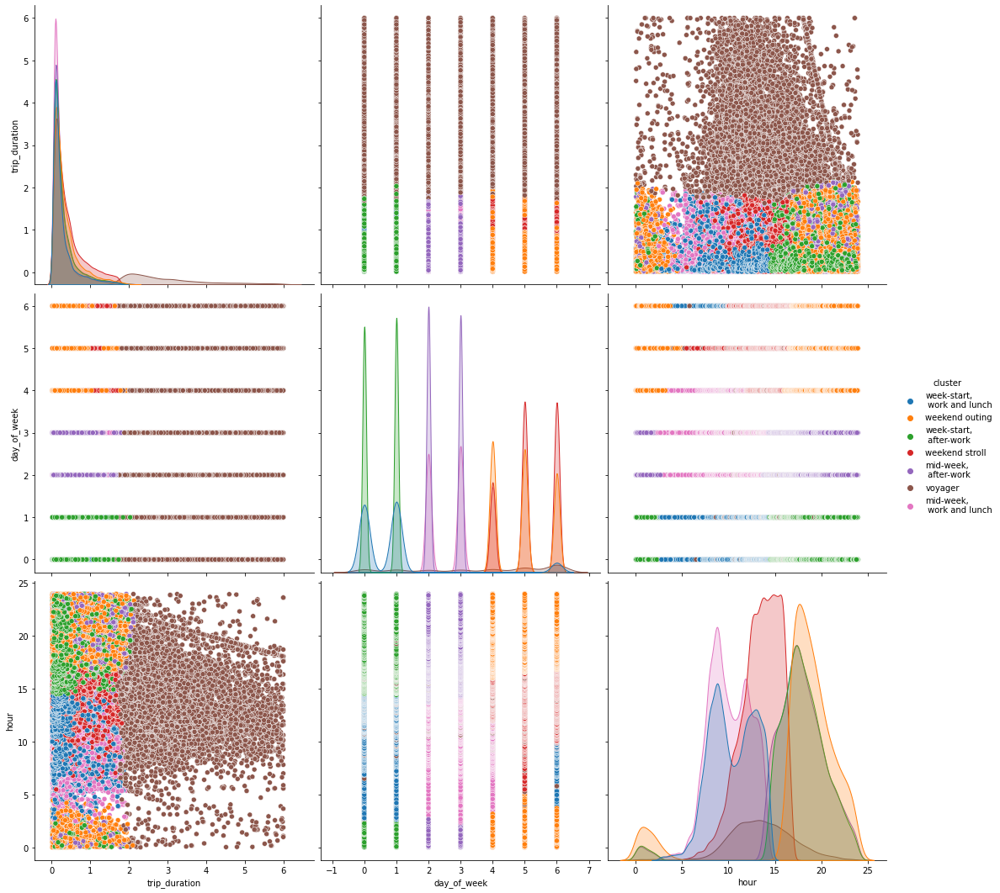

In [15]:
g = sns.pairplot(data=X_scaled_df, hue="cluster", hue_order=cluster_means, 
                 height=5, vars=["trip_duration","day_of_week","hour"])

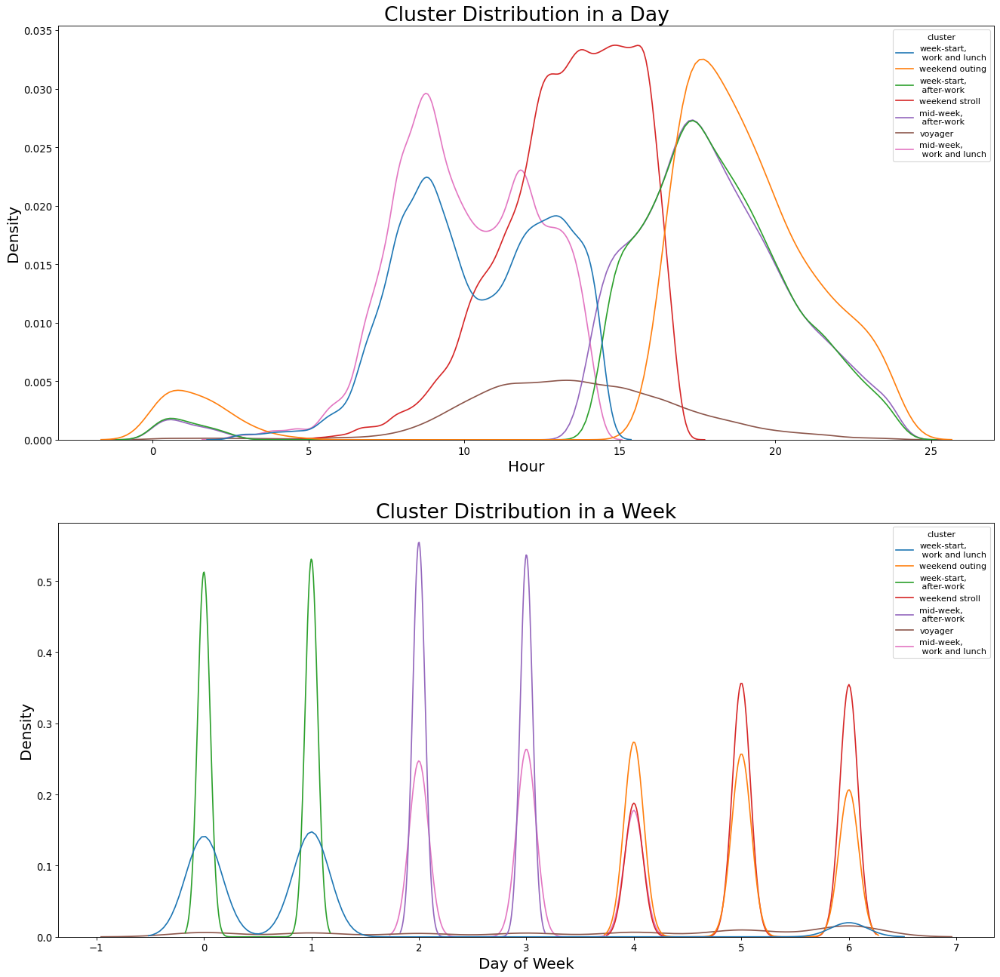

In [16]:
fig,ax = plt.subplots(2,1,figsize=(20,20), dpi= 80) 
axis_font = {'size':'18'}
label_font = {'labelsize':'12'}
dic={'fontsize': '24'}

sns.kdeplot(data=X_scaled_df, x="hour", hue="cluster",hue_order=cluster_means, ax=ax[0])
sns.kdeplot(data=X_scaled_df, x="day_of_week", hue="cluster",hue_order=cluster_means, ax=ax[1])

ax[0].set_title("Cluster Distribution in a Day", dic)
ax[0].set_ylabel("Density", **axis_font)
ax[0].set_xlabel("Hour", **axis_font)
ax[0].tick_params(axis='both', **label_font)

ax[1].set_title("Cluster Distribution in a Week", dic)
ax[1].set_ylabel("Density", **axis_font)
ax[1].set_xlabel("Day of Week", **axis_font)
ax[1].tick_params(axis='both', **label_font)

plt.show()

### Visual Representation of Geographical Demand Patterns

To determine geographic differences in the cluster distribution, we will plot the clusters for the 4 station accumulations in Santa Monica, La Center, Pasadena and San Pedro.

In [17]:
df_LA_stations = pd.read_pickle("../data/LA_stations.pickle")
df_LA_stations

#search for stations at the border and user their lat and lon values
lat1 = df_LA_stations[df_LA_stations['station_name']=='Anaheim & Avalon']['coord'].values[0][0]
lon1 = df_LA_stations[df_LA_stations['station_name']=='Downtown Santa Monica E Line Station']['coord'].values[0][1]
lon2 = df_LA_stations[df_LA_stations['station_name']=='Washington & Abbot Kinney']['coord'].values[0][1]
lon3 = df_LA_stations[df_LA_stations['station_name']=='Cabrillo Beach']['coord'].values[0][1]
lon4 = df_LA_stations[df_LA_stations['station_name']=='Mariachi Plaza']['coord'].values[0][1]
lon5 = df_LA_stations[df_LA_stations['station_name']=='Rose Bowl']['coord'].values[0][1]
lon6 = df_LA_stations[df_LA_stations['station_name']=='Pasadena City College']['coord'].values[0][1]

#filter the df
santa_monica_geo_df = df_LA_stations[(df_LA_stations['lon'] >= lon1)&(df_LA_stations['lon'] <= lon2)]
la_center_geo_df = df_LA_stations[(df_LA_stations['lon'] >= lon3)&(df_LA_stations['lon'] <= lon4)&(df_LA_stations['lat'] >= lat1)]
pasadena_geo_df = df_LA_stations[(df_LA_stations['lon'] >= lon5)&(df_LA_stations['lon'] <= lon6)]
san_pedrogeo__df = df_LA_stations[(df_LA_stations['lon'] >= lon3)&(df_LA_stations['lon'] <= lon4)&(df_LA_stations['lat'] <= lat1)]

#ids in list
santa_monica_list = santa_monica_geo_df['station_id'].tolist()
la_center_list = la_center_geo_df['station_id'].tolist()
pasadena_list = pasadena_geo_df['station_id'].tolist()
san_pedro_list = san_pedrogeo__df['station_id'].tolist()

#demand for the different locations
santa_monica_df=X_scaled_df[X_scaled_df.start_station_id.isin(santa_monica_list)]
la_center_df=X_scaled_df[X_scaled_df.start_station_id.isin(la_center_list)]
pasadena_df=X_scaled_df[X_scaled_df.start_station_id.isin(pasadena_list)]
san_pedro_df=X_scaled_df[X_scaled_df.start_station_id.isin(san_pedro_list)]

In [18]:
def plot_for_location(location_df):
    sns.pairplot(data=location_df, hue="cluster",hue_order=cluster_means,
                 height=5, vars=["trip_duration","day_of_week","hour"])

**Santa Monica:** <br>
In Santa Monica, there are an above-average number of long trips and weekend trips. <br>
These accumulations could be due to Santa Monica's proximity to the sea.

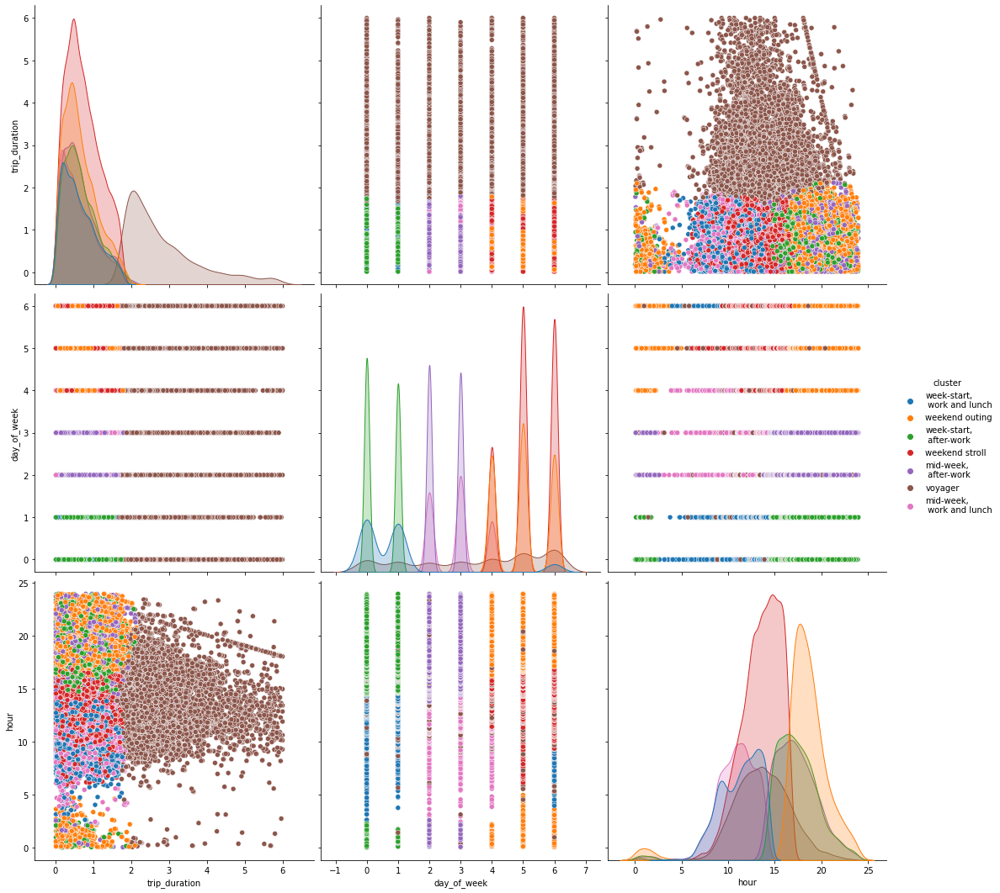

In [19]:
plot_for_location(santa_monica_df)

**La Center:** <br>
The stations in the center of La have an above-average number of trips in the morning and in the afternoon.<br> It is likely that these stations are used as start or end stations on the way to work and on the way home from work.

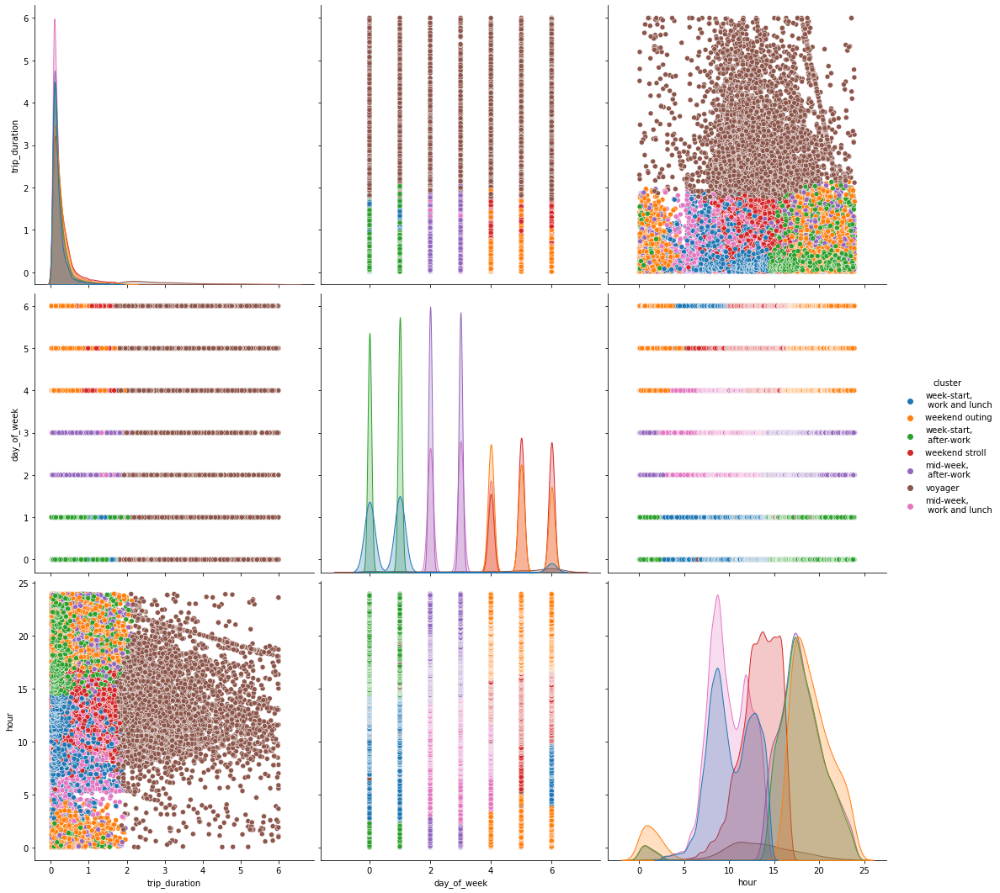

In [20]:
plot_for_location(la_center_df)

**Pasadena:** <br>

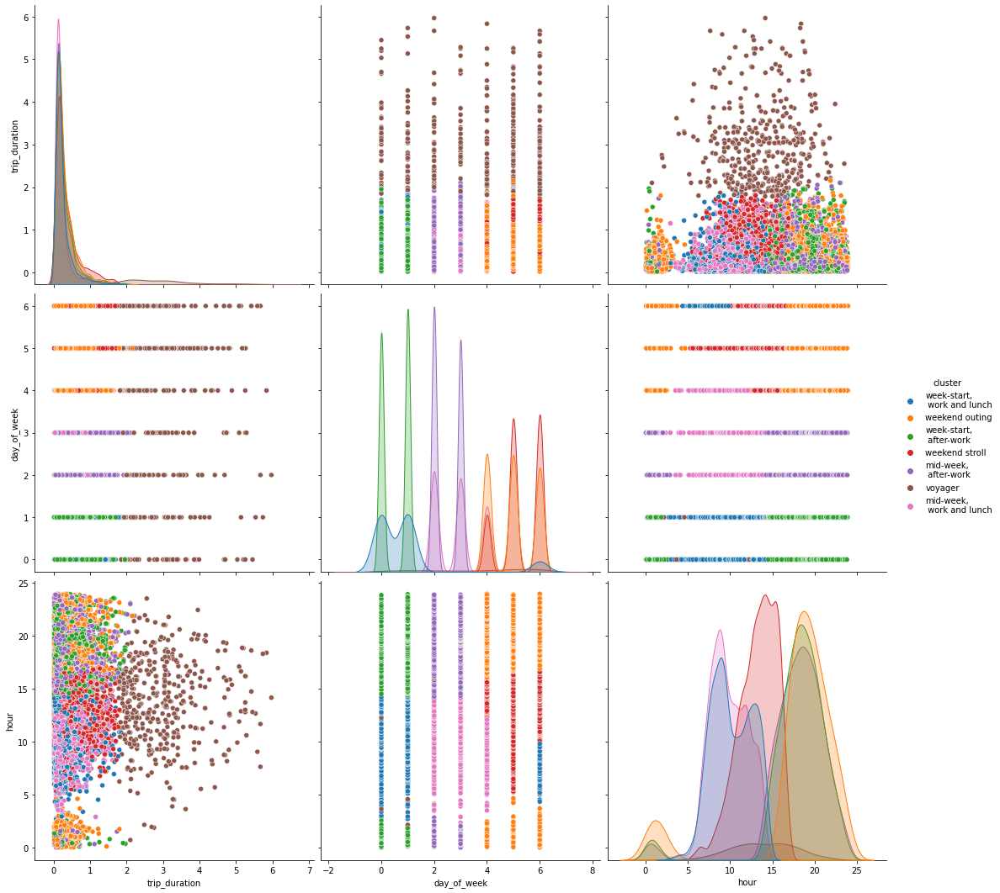

In [21]:
plot_for_location(pasadena_df)

**San Pedro:** <br>
In San Pedro, there are an above-average number of weekend trips at noon as well as in the afternoon . <br>
These accumulations could be due to San Pedro's proximity to the ocean.

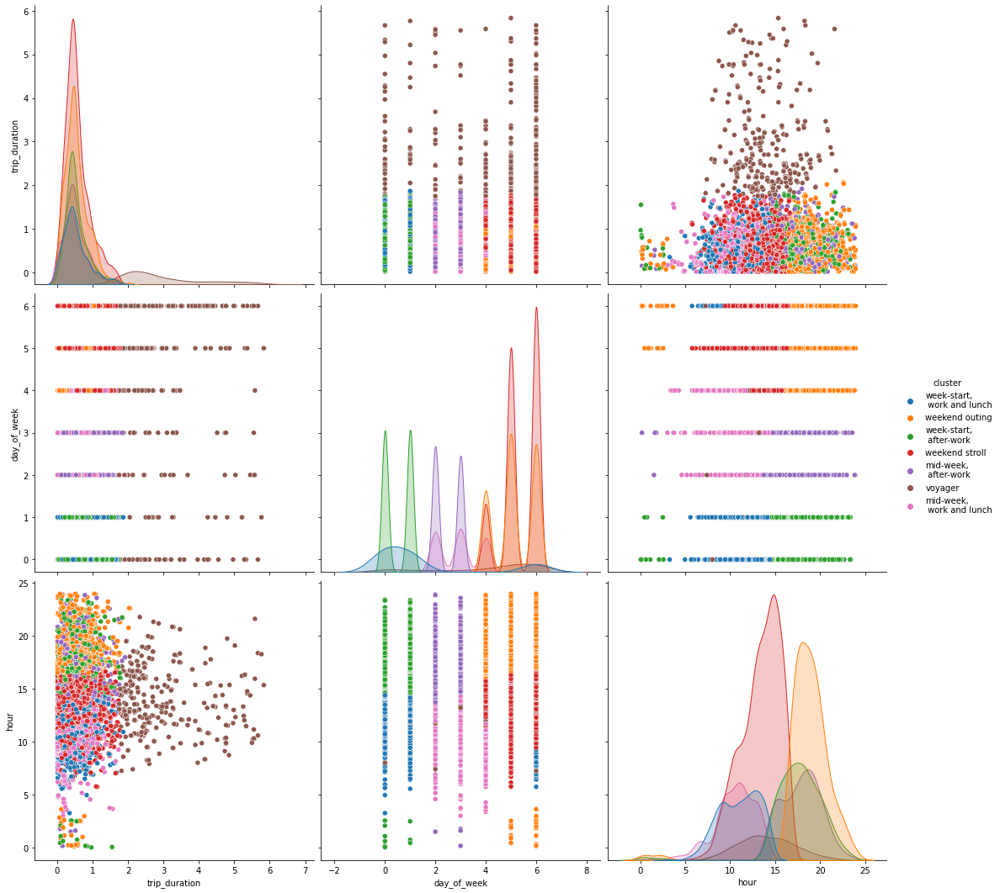

In [22]:
plot_for_location(san_pedro_df)

## Cluster Analysis for Stations

In the second part of this cluster analysis we will cluster the locations based on their demand pattern.<br> To achieve this, we will first generate an new dataset of time series for the hourly usage of every station in Los Angeles.<br> The usage of a station is thereby calculated by number of time a station is a start or end station of a trip in the respective hour.<br> To cluster the resulting time series we will use time series K-Means.

### Data Preparation

In [23]:
df_station_geo = df_LA_stations.copy()
virtual = {'station_name':'Virtual','station_id':3000}
df_station_geo=df_station_geo.append(virtual, ignore_index=True)
df_station_geo=df_station_geo.set_index("station_id").sort_index()
df_station_geo

,lat,lon,station_name,7/7/2016,N/A,Active,coord
station_id,,,,,,,
3000,NaN,NaN,Virtual,NaN,NaN,NaN,NaN
3005,34.048500,-118.258537,7th & Flower,7/7/2016,DTLA,Active,"[34.0485, -118.258537]"
3006,34.045540,-118.256668,Olive & 8th,7/7/2016,DTLA,Active,"[34.04554, -118.256668]"
3007,34.050480,-118.254593,5th & Grand,7/7/2016,DTLA,Active,"[34.05048, -118.254593]"
3008,34.046612,-118.262733,Figueroa & 9th,7/7/2016,DTLA,Active,"[34.046612, -118.262733]"
...,...,...,...,...,...,...,...
4266,34.026291,-118.277687,28th & Figueroa,NaN,DTLA,Active,"[34.026291, -118.277687]"
4267,34.027618,-118.280678,28th & University,11/29/2018,DTLA,Active,"[34.027618, -118.280678]"
4273,34.025860,-118.284103,Hoover & 32nd,8/23/2018,DTLA,Active,"[34.02586, -118.284103]"


In [24]:
#create df with time of usage and station id
df_start_staion = df[["start_time","start_station_id"]].copy()
df_start_staion.rename(columns={"start_time":"time","start_station_id":"station_id"}, inplace=True)
df_end_staion = df[["end_time","end_station_id"]].copy()
df_end_staion.rename(columns={"end_time":"time","end_station_id":"station_id"}, inplace=True)
df_station = df_start_staion.append(df_end_staion, ignore_index=True)

# add usage count
df_station["usage"]=1

df_station.set_index("time",inplace=True)
df_station

,station_id,usage
time,,
2018-01-01 00:04:00,3063,1
2018-01-01 00:05:00,3063,1
2018-01-01 00:06:00,3063,1
2018-01-01 00:13:00,3018,1
2018-01-01 00:14:00,4204,1
...,...,...
2018-12-31 23:54:00,3030,1
2018-12-31 23:56:00,3046,1
2018-12-31 23:56:00,3046,1


In [25]:
# create time series data of usage for all staions
grouper=df_station.groupby([pd.Grouper(freq='1H'), 'station_id'],)
station_cluster=grouper.count().unstack('station_id').fillna(0)

station_clusterT=station_cluster.transpose()
station_clusterT=station_clusterT.droplevel(0)
station_clusterT

time,2018-01-01 00:00:00,2018-01-01 01:00:00,2018-01-01 02:00:00,2018-01-01 03:00:00,2018-01-01 04:00:00,2018-01-01 05:00:00,2018-01-01 06:00:00,2018-01-01 07:00:00,2018-01-01 08:00:00,2018-01-01 09:00:00,...,2018-12-31 14:00:00,2018-12-31 15:00:00,2018-12-31 16:00:00,2018-12-31 17:00:00,2018-12-31 18:00:00,2018-12-31 19:00:00,2018-12-31 20:00:00,2018-12-31 21:00:00,2018-12-31 22:00:00,2018-12-31 23:00:00
station_id,,,,,,,,,,,,,,,,,,,,,
3000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
3005,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,3.0,6.0,2.0,0.0,5.0,0.0,0.0,0.0,2.0,0.0
3006,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,5.0,3.0,2.0,3.0,3.0,0.0,3.0,0.0,0.0
3007,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3008,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,1.0,1.0,2.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4266,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
4267,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4273,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


To use TimeSeriesKMeans we have to transform the dataset to a numpy-array of shape = (number of time series, size of time series, dimension of time series).

In [26]:
station_cluster_array = station_clusterT.to_numpy().reshape(132,8529,1)
station_cluster_array

array([[[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [3.],
        ...,
        [0.],
        [2.],
        [0.]],

       [[2.],
        [0.],
        [0.],
        ...,
        [3.],
        [0.],
        [0.]],

       ...,

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]]])

### Estimation of Hyperparameter 

In [27]:
k_max =100
clusters = []
losses = []

for k in range(k_max):
    model = TimeSeriesKMeans(n_clusters=k+1,random_state=42).fit(station_cluster_array)
    clusters.append(k+1)
    losses.append(model.inertia_)

We use the elbow method to determine the best number of clusters for the station demand data.

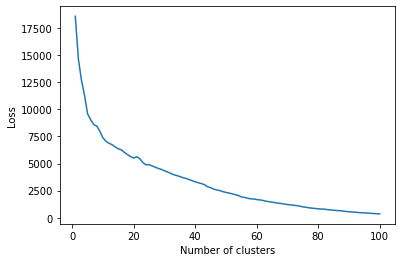

In [28]:
plt.plot(clusters, losses)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.show()

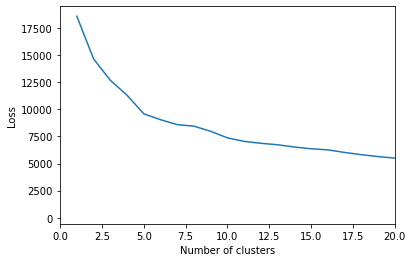

In [29]:
plt.plot(clusters, losses)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.xlim([0,20])
plt.show()

From the two plots above we expect five clusters to be the best fit for our dataset.

### Clustering

In [30]:
#refit model
means_ts = TimeSeriesKMeans(n_clusters=5, max_iter=50,random_state=42).fit(station_cluster_array)
means_ts.fit(station_cluster_array)

numbers = ["zero", "one", "two", "three","four"]

# add culculated clusters ta dataset
df_station_geo["cluster"] = means_ts.predict(station_cluster_array)
df_station_geo["cluster"] = df_station_geo["cluster"].apply(lambda x: numbers[x])

df_station_geo

,lat,lon,station_name,7/7/2016,N/A,Active,coord,cluster
station_id,,,,,,,,
3000,NaN,NaN,Virtual,NaN,NaN,NaN,NaN,four
3005,34.048500,-118.258537,7th & Flower,7/7/2016,DTLA,Active,"[34.0485, -118.258537]",two
3006,34.045540,-118.256668,Olive & 8th,7/7/2016,DTLA,Active,"[34.04554, -118.256668]",three
3007,34.050480,-118.254593,5th & Grand,7/7/2016,DTLA,Active,"[34.05048, -118.254593]",three
3008,34.046612,-118.262733,Figueroa & 9th,7/7/2016,DTLA,Active,"[34.046612, -118.262733]",three
...,...,...,...,...,...,...,...,...
4266,34.026291,-118.277687,28th & Figueroa,NaN,DTLA,Active,"[34.026291, -118.277687]",zero
4267,34.027618,-118.280678,28th & University,11/29/2018,DTLA,Active,"[34.027618, -118.280678]",zero
4273,34.025860,-118.284103,Hoover & 32nd,8/23/2018,DTLA,Active,"[34.02586, -118.284103]",zero


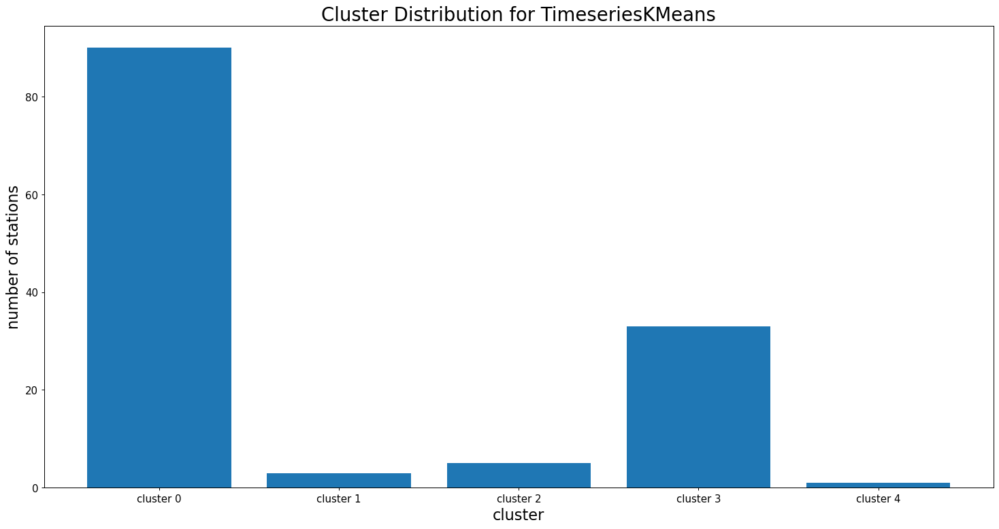

In [31]:
#seperate clusters in own lists
cluster_0 = df_station_geo[df_station_geo.cluster==numbers[0]].index
cluster_1 = df_station_geo[df_station_geo.cluster==numbers[1]].index
cluster_2 = df_station_geo[df_station_geo.cluster==numbers[2]].index
cluster_3 = df_station_geo[df_station_geo.cluster==numbers[3]].index
cluster_4 = df_station_geo[df_station_geo.cluster==numbers[4]].index

clusters=[cluster_0,cluster_1,cluster_2,cluster_3,cluster_4]

#plot cluster distribution
fig,ax = plt.subplots(figsize=(20,10), dpi=90) 
axis_font = {'size':'18'}
label_font = {'labelsize':'12'}
dic={'fontsize': '22'}

count = [len(clusters[i]) for i in range(len(clusters))]
cluster = ["cluster "+str(i) for i in range(len(clusters))]
plt.bar(cluster,count)

ax.set_title("Cluster Distribution for TimeseriesKMeans", dic)
ax.set_ylabel("number of stations", **axis_font)
ax.set_xlabel("cluster", **axis_font)
ax.tick_params(axis='both', **label_font)

plt.show()

### Cluster Visualization

In the following we will plot the usage off all stations is a cluster as well as the average usage of these stations.
To better visualize the demand patterns of the stations, we will also present average weekly usage of the stations.

In [32]:
#group data by hour and day of week
station_cluster_weekly = station_cluster.groupby([station_cluster.index.dayofweek, station_cluster.index.hour]).mean()
station_cluster_weekly.reset_index(drop=True,inplace=True)

station_cluster_weeklyT = station_cluster_weekly.transpose()
station_cluster_weeklyT = station_cluster_weeklyT.droplevel(0)
station_cluster_weeklyT

,0,1,2,3,4,5,6,7,8,9,...,158,159,160,161,162,163,164,165,166,167
station_id,,,,,,,,,,,,,,,,,,,,,
3000,0.000000,0.019231,0.041667,0.025,0.000000,0.019608,0.056604,0.188679,0.264151,0.396226,...,6.211538,6.365385,3.211538,1.000000,0.653846,0.653846,0.403846,0.365385,0.153846,0.019231
3005,0.711538,0.307692,0.291667,0.350,0.657143,0.803922,0.962264,3.075472,5.754717,3.452830,...,4.365385,4.211538,3.634615,4.307692,4.634615,3.134615,2.307692,2.423077,1.461538,0.903846
3006,0.326923,0.192308,0.208333,0.125,0.114286,0.254902,0.396226,0.849057,1.358491,1.339623,...,2.673077,2.423077,2.230769,2.653846,2.173077,2.153846,1.192308,1.057692,1.000000,0.615385
3007,0.115385,0.038462,0.041667,0.100,0.000000,0.176471,0.339623,0.641509,2.113208,2.056604,...,1.942308,1.903846,1.884615,0.980769,0.942308,0.307692,0.365385,0.480769,0.384615,0.115385
3008,0.326923,0.288462,0.125000,0.050,0.085714,0.058824,0.226415,1.264151,2.000000,1.433962,...,1.500000,2.096154,1.865385,1.634615,1.653846,1.750000,1.115385,1.173077,0.865385,0.519231
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4266,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.037736,0.075472,...,0.038462,0.000000,0.019231,0.096154,0.019231,0.019231,0.038462,0.000000,0.076923,0.000000
4267,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.037736,0.000000,0.075472,...,0.115385,0.076923,0.115385,0.192308,0.000000,0.019231,0.057692,0.115385,0.000000,0.000000
4273,0.000000,0.019231,0.000000,0.000,0.000000,0.000000,0.018868,0.018868,0.113208,0.056604,...,0.057692,0.057692,0.096154,0.038462,0.153846,0.038462,0.057692,0.000000,0.000000,0.000000


In [33]:
def plot_Cluster(cluster, number, name):
    fig,ax = plt.subplots(2,1,figsize=(40,45), dpi=100) 
    axis_font = {'size':'35'}
    label_font = {'labelsize':'25', 'width':3, 'length':4}
    dic={'fontsize': '45'}
    
    #plot demand of stations in cluster over the year
    for ts in cluster:
        #plot all timeseries of the respective cluster in gray
        ax[0].plot(station_clusterT.transpose()[ts], color = 'tab:gray', alpha=.5)
    
    #plot the mean value for all timeseries of the respective cluster in red
    ax[0].plot(station_clusterT[station_clusterT.index.isin(cluster)].mean(), color = 'tab:red')
    
    ax[0].set_title("Cluster {}: {}".format(number,name), dic)
    ax[0].set_ylabel('station useage',**axis_font)
    ax[0].set_xlabel('date',**axis_font)
    ax[0].tick_params(axis='both', **label_font)
    
    
    #plot average weekly demand of stations in cluster
    for ts in cluster:
        #plot all timeseries of the respective cluster in gray
        ax[1].plot(station_cluster_weeklyT.transpose()[ts], color = 'tab:gray', alpha=.5)
        
    #plot the mean value for all timeseries of the respective cluster in red
    ax[1].plot(station_cluster_weeklyT[station_cluster_weeklyT.index.isin(cluster)].mean(), color = 'tab:red',
               linewidth=2)
    
    ax[1].set_title("Cluster {}: {}".format(number,name), dic)
    ax[1].set_ylabel('average station useage',**axis_font)
    ax[1].set_xlabel('day',**axis_font)
    
    ax[1].set_xlim([-5,171])
    ax[1].xaxis.set_ticks(np.arange(12, 169, 24))
    ax[1].set_xticklabels(["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"])
    ax[1].xaxis.set_minor_locator(MultipleLocator(6))
    
    ax[1].tick_params(axis='both', **label_font)
    ax[1].tick_params(which='minor', **label_font)
    
    plt.show()

**Cluster 0: Now and Again**<br>
The first cluster contains the most stations of all clusters. The stations in this cluster have on average low demand of under one use an hour. However, the stations are also in irregular high demand, up to 80 uses per hour.

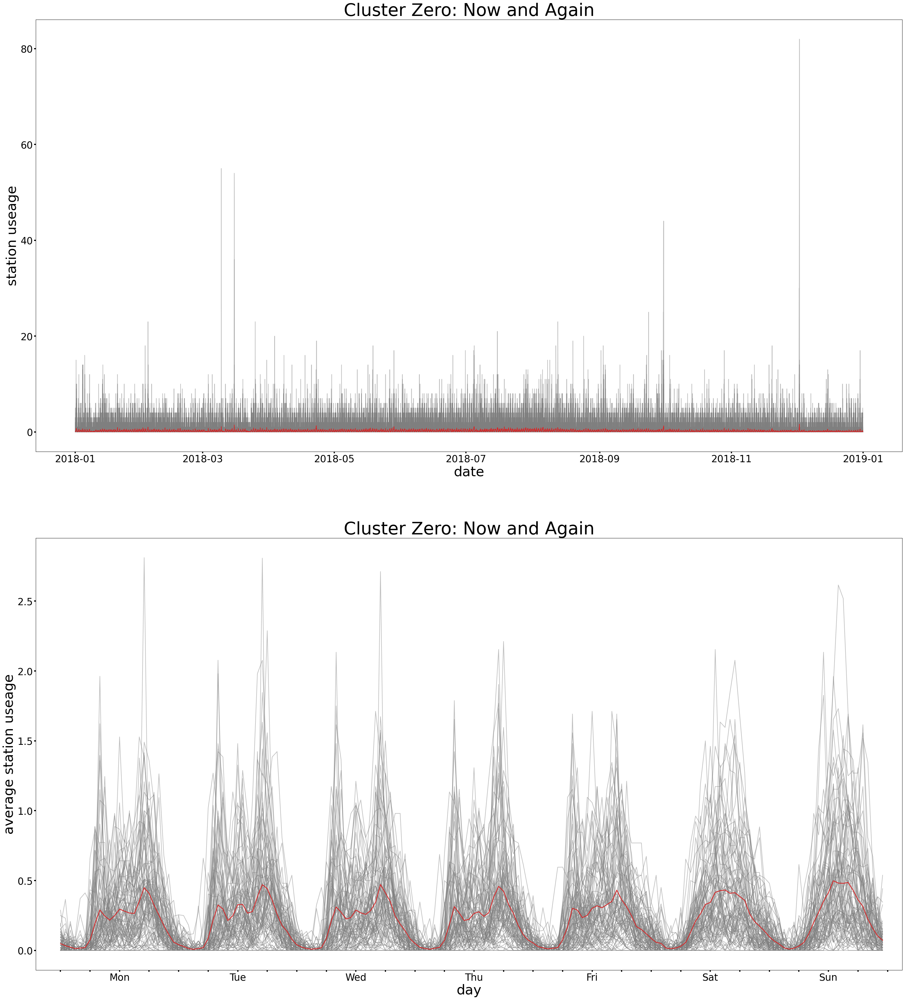

In [34]:
plot_Cluster(cluster_0, "Zero", "Now and Again")

**Cluster 1: Beach Trips**<br>
The three stations at the cost of Santa Monica (visualized in the following) have an higher and moreregular demand than the stations in cluster 0. They show a higher demand in the afternoon and on weekends. One can assume that these stations are used to take a ride along the beach.

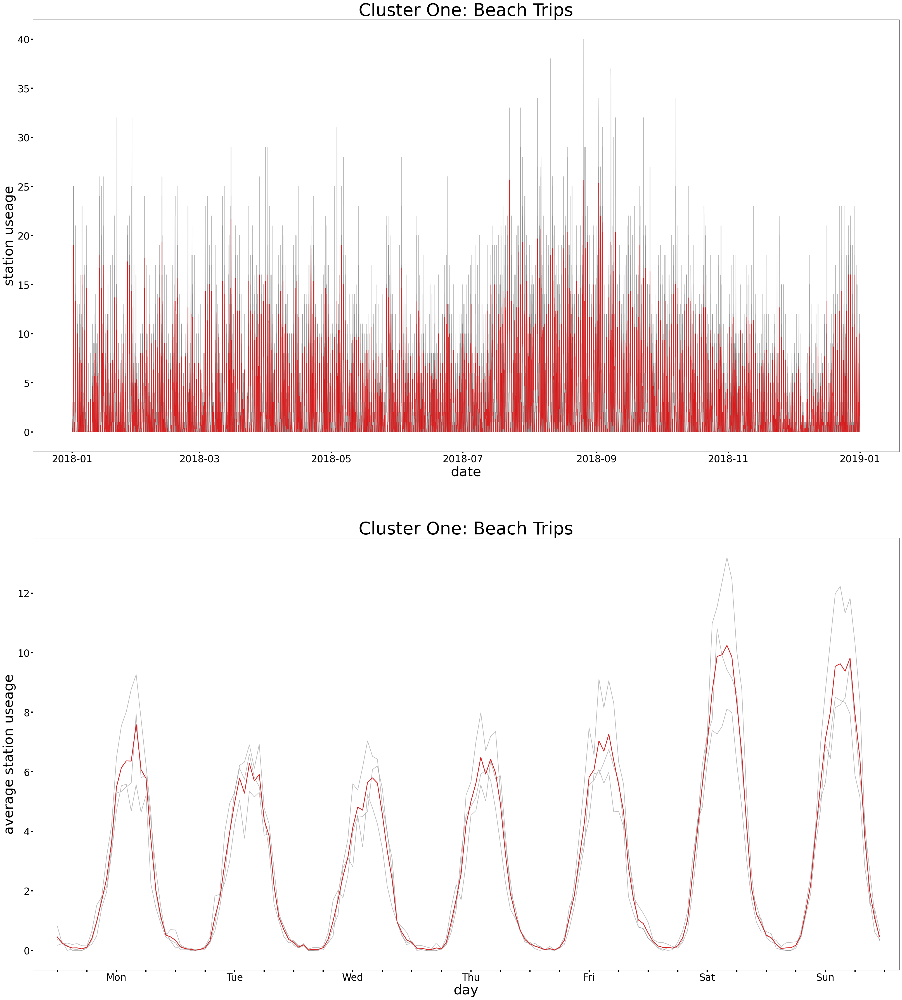

In [35]:
plot_Cluster(cluster_1, "One", "Beach Trips")

**Cluster 2: Way to Work** <br>
The stations in cluster 2 have a regular demand. The usage of these stations are highest from Monday to Friday in the morning and in the afternoon. One can assume that these stations are used on the way to and from work.

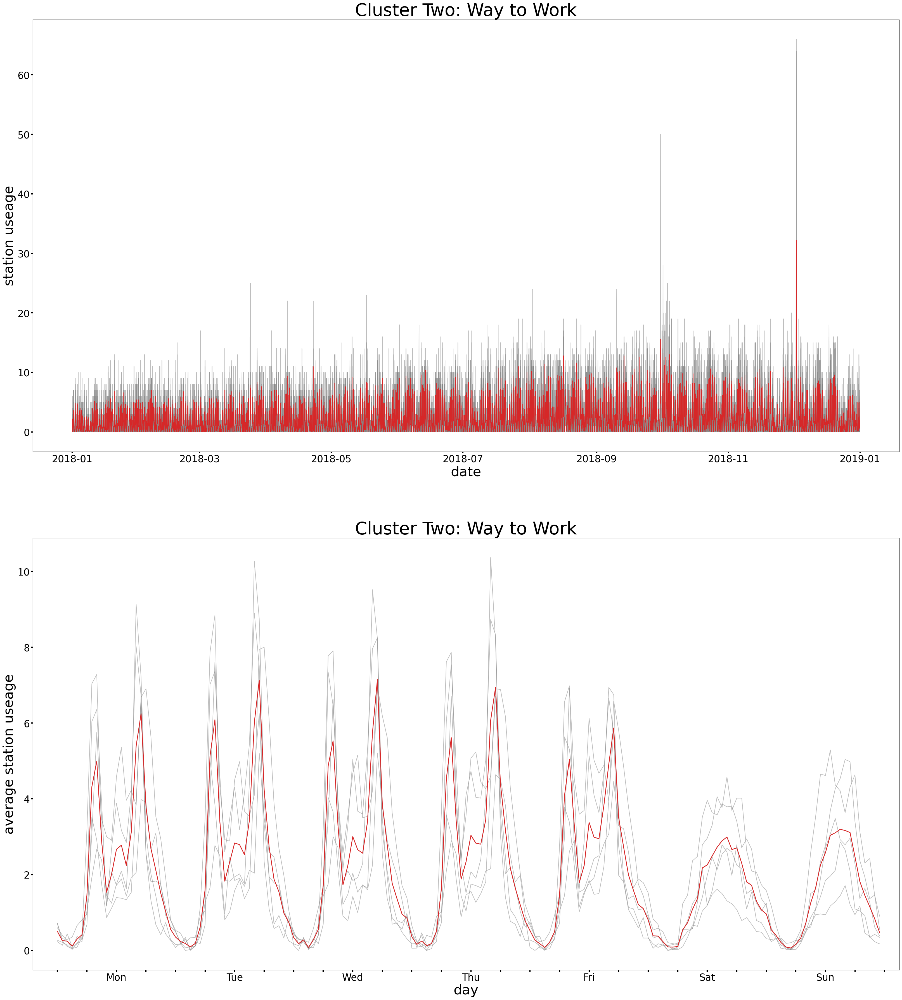

In [36]:
plot_Cluster(cluster_2, "Two", "Way to Work")

**Cluster 3: Points of Interst** <br>
The stations of cluster 3 on average have an low but regular demand over the whole year. The average demand of these stations is higest during the afternoon at any day of the week. These stations may be near a Ponit of interest like restaturants.

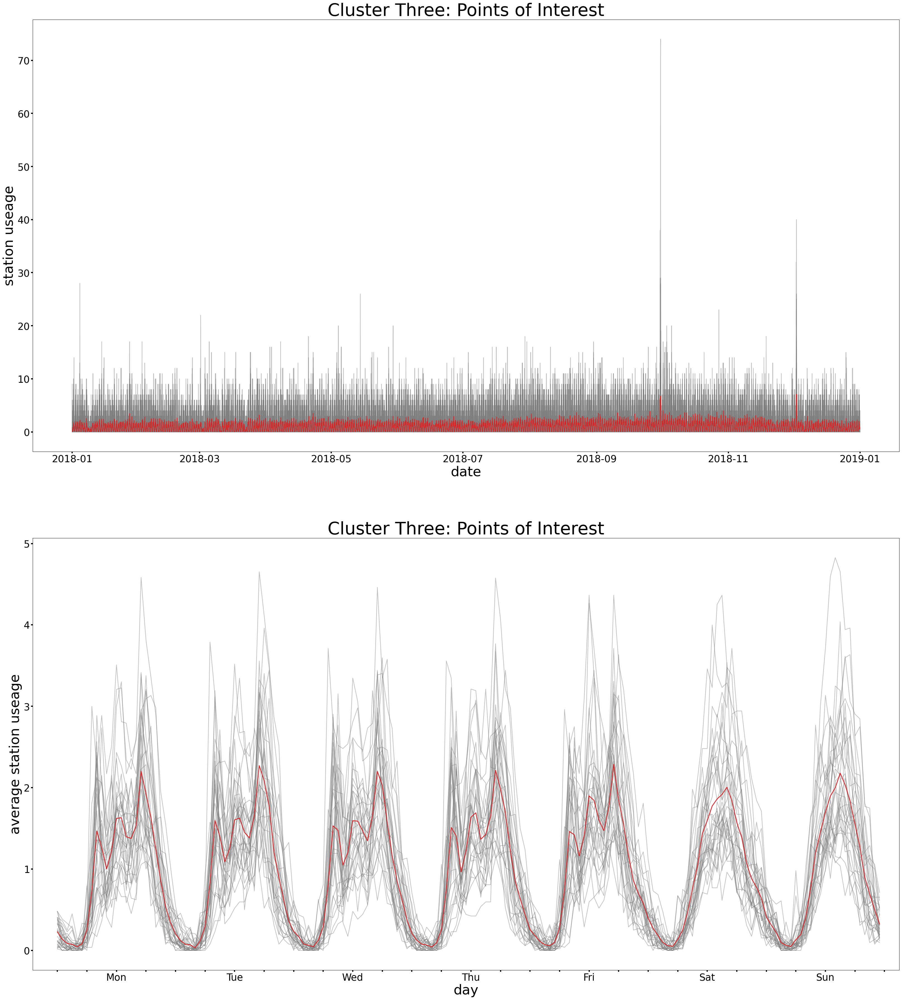

In [37]:
plot_Cluster(cluster_3, "Three", "Points of Interest")

**Cluster 4: LA Phil 100 x CicLAvia**<br>
The last cluster only contains one single virtual station. The virtual station is used by staff to check in or check out a bike remotely for a special event or in a situation in which a bike could not otherwise be checked in or out to a station. This station has a peak demand of over 250 bike rentals an hour due ti which it likely could not be clustered with any other station. The peak demand of this stations occoured during the event: LA Phil 100 x CicLAvia.

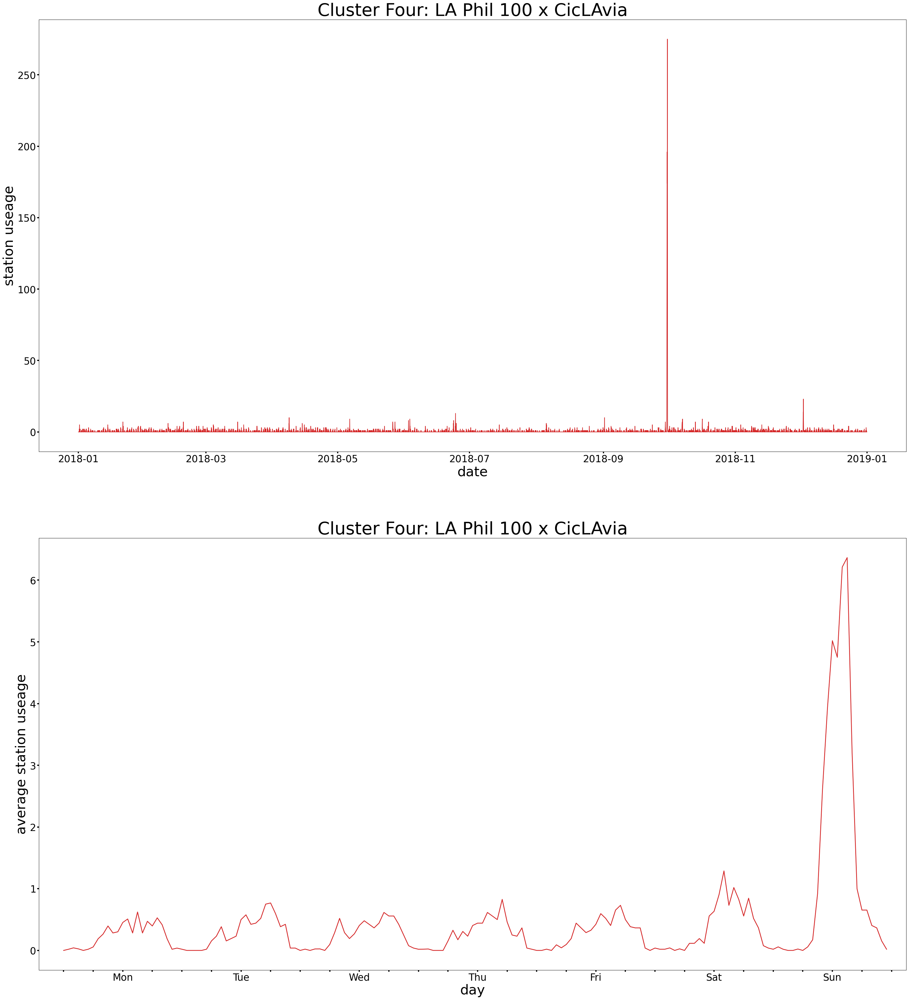

In [38]:
plot_Cluster(cluster_4, "Four", "LA Phil 100 x CicLAvia")

**Geographical Distribution** <br>

<AxesSubplot:xlabel='lon', ylabel='lat'>

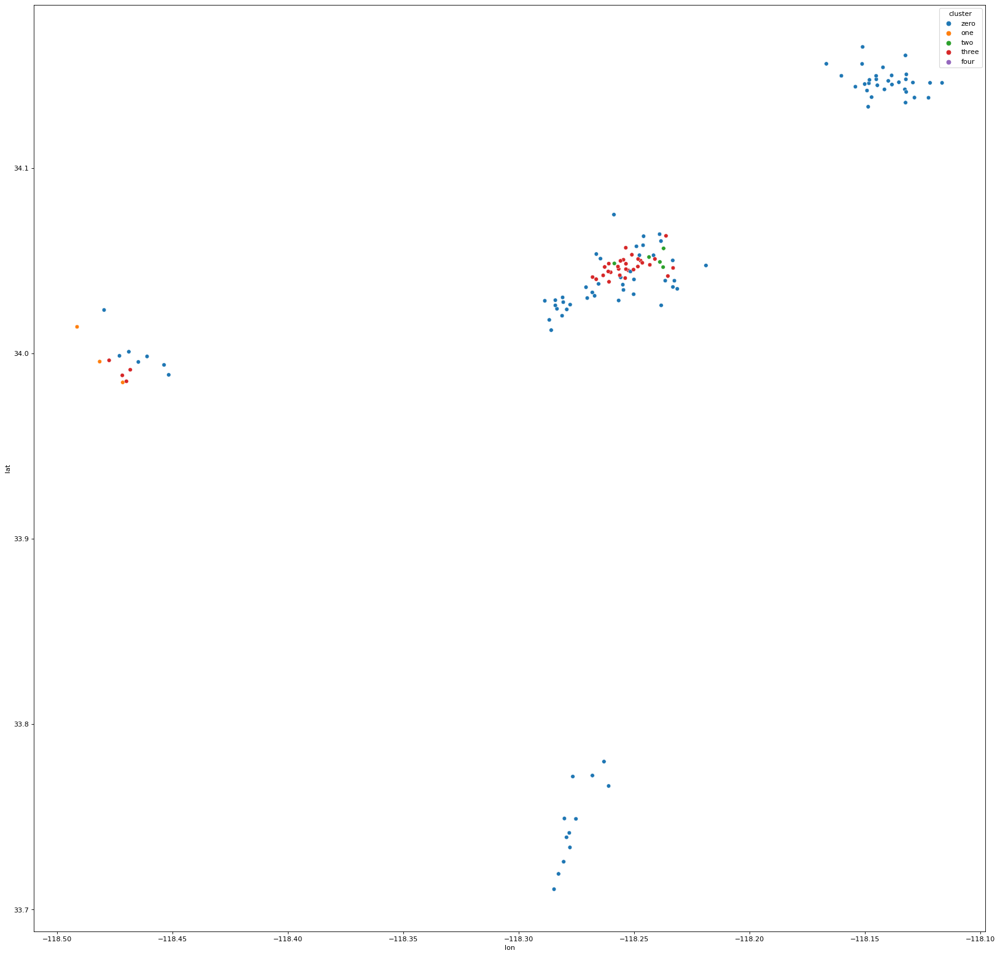

In [39]:
#todo: heatmap, description
fig,ax = plt.subplots(figsize=(25,25), dpi= 80) 
axis_font = {'size':'20'}
label_font = {'labelsize':'12'}
dic={'fontsize': '24'}
sns.scatterplot(data=df_station_geo, x="lon", y="lat", hue="cluster",hue_order=numbers)

In [62]:
#define which color for which cluster
colordict = {"zero":'blue', "one":'orange', "two":'green', "three":'red',"four":'purple'}

#define LA center
center = np.array(['34.053691', '-118.242766'])

#for easy handling with folium function
df_LA_stations = df_station_geo.dropna().reset_index()

# define new map function
def getLocations(station_id):
    getLocations = folium.Map(
        location=center, 
        tiles='OpenStreetMap', 
        zoom_start=11, 
        control_scale=True, 
        max_zoom=20)
    # add station point map
    for station in station_id:
        geo = df_LA_stations.coord[df_LA_stations['station_id'] == station].values[0]
        #print(geo)
        folium.CircleMarker(
            radius=1,
            location=geo,
            popup='Station ID: '+ str(station), 
            color=colordict.get(df_LA_stations.cluster[df_LA_stations['station_id'] == station].values[0]), 
            alpha=0.2,
            fill_color='crimson'
        ).add_to(getLocations)
    return getLocations

getLocations(df_LA_stations.station_id.tolist())